In [2]:
import numpy as np
import modin.pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
from descartes import PolygonPatch
from shapely.geometry import Point, Polygon, MultiPolygon, LineString
from tqdm.auto import tqdm
import shapely.speedups
shapely.speedups.enable() 
import warnings
warnings.filterwarnings('ignore')

In [3]:
PLACE_NAME = 'Mainz, Germany'
name = 'Mainz'
grid_size = 500

epsg:4326
+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs
<class 'shapely.geometry.polygon.Polygon'>


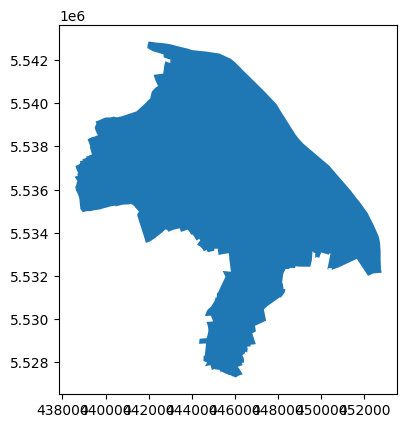

In [4]:
city = ox.geocode_to_gdf(PLACE_NAME)
print(city.crs)
## changing CRS for grid division
city = ox.project_gdf(city) 
print(city.crs)
ax = city.plot()
geometry = city['geometry'].iloc[0]
print(type(geometry))

In [5]:
#save geometry
city.to_file(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}.shp")

#### Division into grid

In [6]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=grid_size) #500 Meter grid
print(type(geometry_cut))
polylist = [poly for poly in geometry_cut.geoms]

<class 'shapely.geometry.multipolygon.MultiPolygon'>


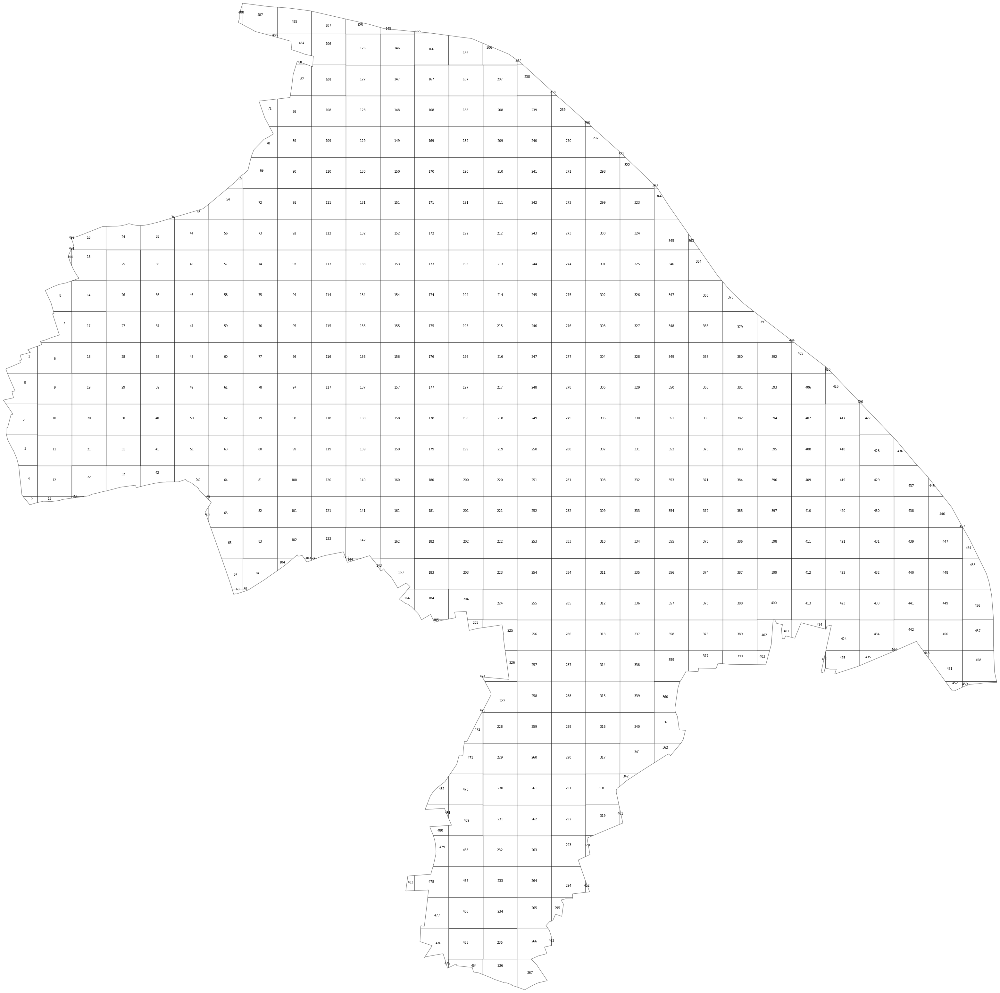

In [7]:
polylist = [poly for poly in geometry_cut.geoms]
# plot city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut.geoms, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=7)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [8]:
city_polyframe = gpd.GeoDataFrame(geometry=polylist)
city_polyframe.crs = city.crs
print(city_polyframe.crs)
city_polyframe.head()

+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((438560.757 5536600.976, 438709.352 5..."
1,"POLYGON ((438621.151 5537026.365, 438597.037 5..."
2,"POLYGON ((439051.872 5536539.370, 439051.872 5..."
3,"POLYGON ((439051.872 5536052.375, 439051.872 5..."
4,"POLYGON ((439051.872 5535565.380, 439051.872 5..."


(6428203.8218586305, 6452392.204891308)

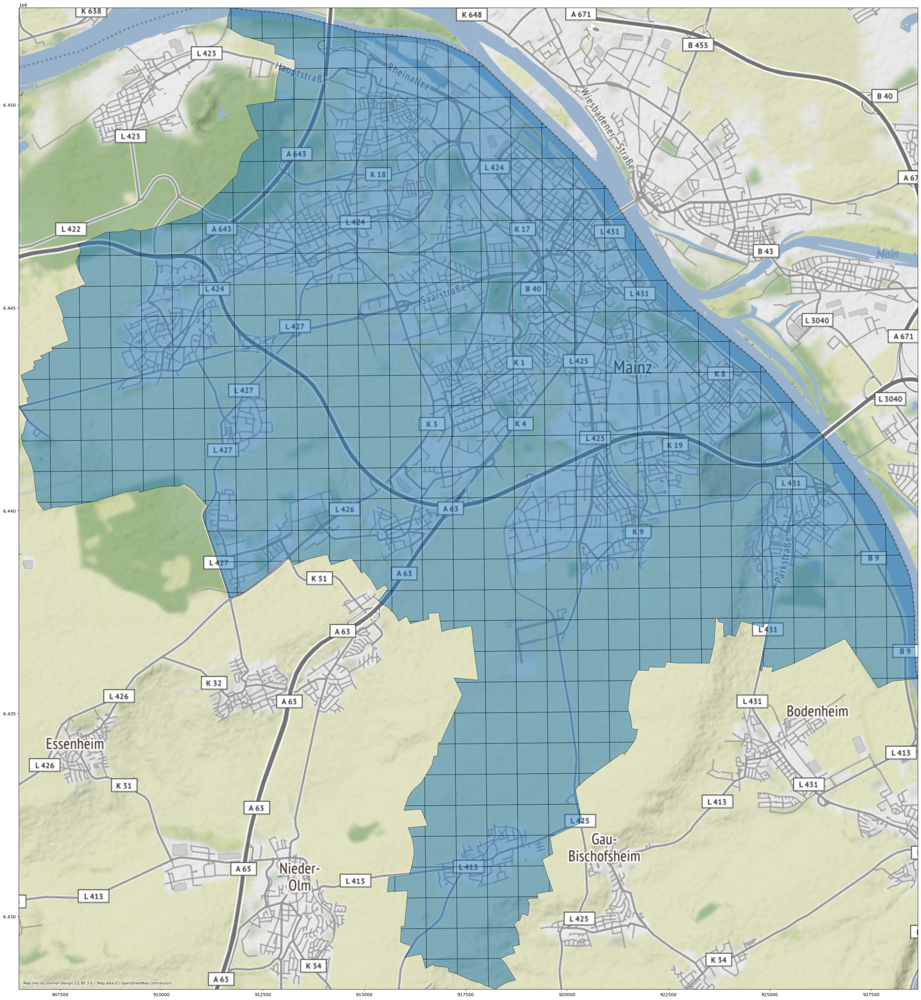

In [9]:
import contextily as ctx
# ctx uses epsg:3857ax = city.plot()
polyframe_3857 = city_polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

#### POIs
- Understanding each one of them and making dataset

In [10]:
city_polyframe_lat_long = ox.project_gdf(city_polyframe, to_latlong=True) #Changing CRS to (Lat, long)
city_polyframe_lat_long.head()

,geometry
0,"POLYGON ((8.14309 49.97858, 8.14515 49.97893, ..."
1,"POLYGON ((8.14386 49.98241, 8.14352 49.98301, ..."
2,"POLYGON ((8.14995 49.97808, 8.15002 49.97370, ..."
3,"POLYGON ((8.15002 49.97370, 8.15010 49.96932, ..."
4,"POLYGON ((8.15010 49.96932, 8.15018 49.96494, ..."


##### 1. EV stations

In [11]:
EV_stations = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "charging_station"},
)
EV_stations.head()
EV_stations.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-EV_stations.csv")

Text(0.5, 1.0, 'Berlin EV stations')

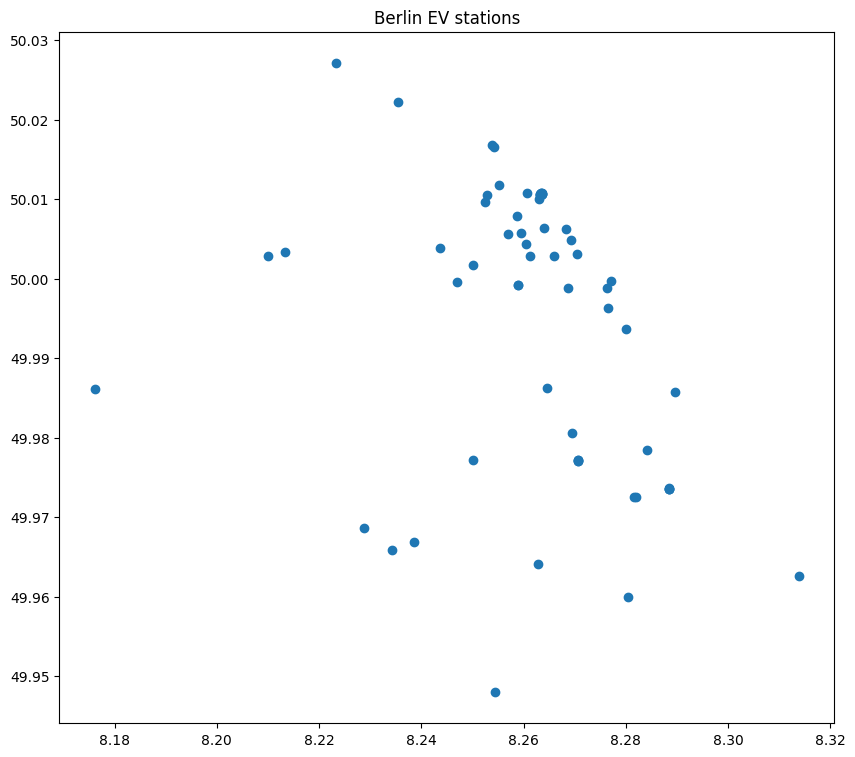

In [12]:
#plot EV stations geo data
EV_stations.plot(figsize=(10,10))
plt.title("Berlin EV stations")

Text(0.5, 1.0, 'Berlin EV stations')

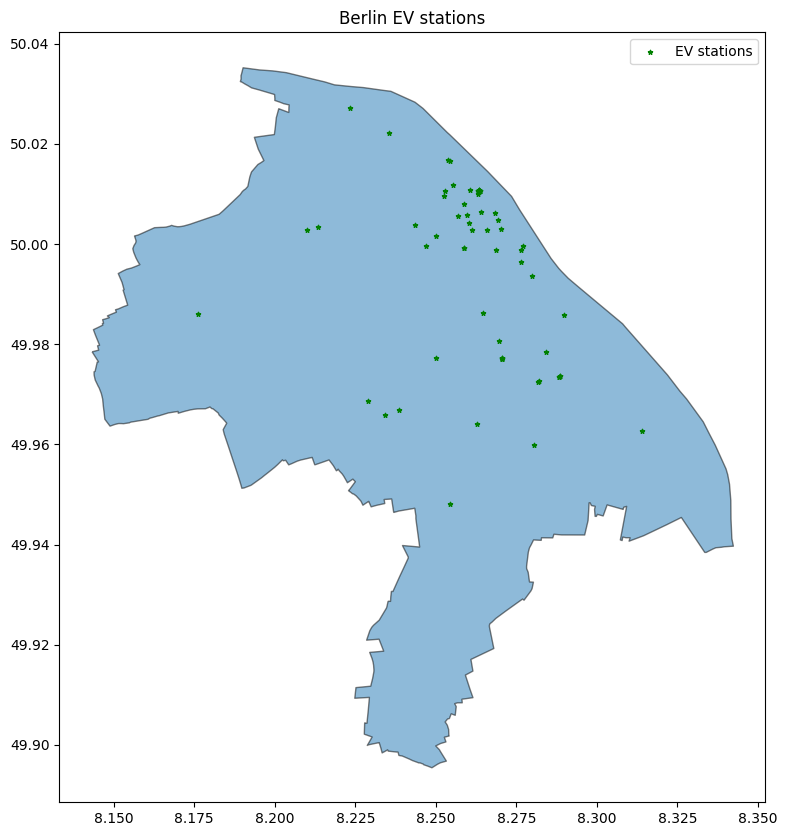

In [13]:
fig, ax = plt.subplots(figsize=(10,10))
ox.project_gdf(city, to_latlong=True).plot(ax =ax, alpha=0.5, edgecolor='k')
EV_stations.plot(ax=ax, color='green', marker='*', markersize=10)
#add legend
plt.legend(['EV stations'])
plt.title("Berlin EV stations")

In [14]:
list(EV_stations.columns)

['amenity',
 'authentication',
 'authentication:debit_card',
 'authentication:membership_card',
 'authentication:money_card',
 'authentication:nfc',
 'authentication:none',
 'capacity',
 'capacity:car',
 'motorcar',
 'name',
 'operator',
 'payment:none',
 'geometry',
 'access:conditional',
 'amperage',
 'bicycle',
 'capacity:cars',
 'fee',
 'opening_hours',
 'payment',
 'scooter',
 'socket:schuko',
 'socket:type2',
 'source',
 'truck',
 'voltage',
 'payment:notes',
 'authentication:app',
 'parking:fee',
 'payment:paypal',
 'payment:token',
 'ref',
 'socket:type2:output',
 'operator:wikidata',
 'operator:wikipedia',
 'payment:cash',
 'payment:credit_cards',
 'socket:chademo',
 'socket:chademo:output',
 'socket:type2_combo',
 'socket:type2_combo:output',
 'access',
 'description',
 'payment:mastercard',
 'payment:visa',
 'contact:website',
 'network',
 'payment:cards',
 'brand',
 'brand:wikidata',
 'brand:wikipedia',
 'survey:date',
 'socket:device:USB-A',
 'ref:EU:EVSE',
 'level',
 'cov

In [15]:
assert np.sum(EV_stations['amenity'].values == 'charging_station') ==  len(EV_stations) #amenity column
### investigating important columns
EV_stations['geometry'].head() #geometry column

element_type  osmid     
node          2212059621    POINT (8.23416 49.96584)
              2621567385    POINT (8.25442 49.94804)
              2689516588    POINT (8.28167 49.97249)
              2769150772    POINT (8.28203 49.97259)
              5074002866    POINT (8.27703 49.99968)
Name: geometry, dtype: geometry

In [19]:
#check null values out of toital values
# print(EV_stations['amperage'].isnull().sum() / len(EV_stations)) #amperage column
# print(EV_stations['voltage'].isnull().sum() / len(EV_stations)) #voltage column
# print(EV_stations['capacity'].isnull().sum() / len(EV_stations)) #capacity column
# print(EV_stations['socket:type2'].isnull().sum() / len(EV_stations)) #socket column
# #output column
# print(EV_stations['output'].isnull().sum() / len(EV_stations)) #output column
# #parking column
# print(EV_stations['parking'].isnull().sum() / len(EV_stations)) #parking column
# #charging_station:output column

In [20]:
#intersection of points and polygons
import shapely.speedups
shapely.speedups.enable() 

masks_EV = []
for i in tqdm(range(0,city_polyframe.shape[0])):
    pip_mask = EV_stations.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_EV.append(pip_mask)

/tmp/ipykernel_27419/3985573752.py:3: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()
100%|██████████| 493/493 [00:00<00:00, 27133.17it/s]


In [22]:
#extract ['amperage', 'voltage', 'amenity', 'capacity'] columns
# EV_stations[masks_EV[1438]][['geometry']]

In [24]:
#EV stations in the 3022 grid (example)
# EV_stations[masks_EV[3022]][['geometry']]

In [25]:
# create a new geodataframe with mask EV stations 
EV_stations_masked = gpd.GeoDataFrame()
for i in tqdm(range(0,city_polyframe.shape[0])):
    EV_stations_masked = pd.concat([EV_stations_masked, EV_stations[masks_EV[i]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]], ignore_index=True)

100%|██████████| 493/493 [00:00<00:00, 544.81it/s]


In [26]:
# EV_stations[masks_EV[1438]]['amperage'].values.tolist()

In [27]:
berlin_polyframe_lat_long_new = city_polyframe_lat_long.copy()
berlin_polyframe_lat_long_new['EV_stations_counts'] = 0
# berlin_polyframe_lat_long_new['EV_stations_aperage'] = 0
# berlin_polyframe_lat_long_new['EV_stations_voltage'] = 0
# berlin_polyframe_lat_long_new['EV_stations_capacity'] = 0
berlin_polyframe_lat_long_new['EV_stations_geomery'] = 0

In [28]:
for i in tqdm(range(0,berlin_polyframe_lat_long_new.shape[0])):
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_counts'] = EV_stations[masks_EV[i]].shape[0]
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_aperage'] = str(EV_stations[masks_EV[i]][['amperage']].values.tolist())
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_voltage'] = str(EV_stations[masks_EV[i]][['voltage']].values.tolist())
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_capacity'] = str(EV_stations[masks_EV[i]][['capacity']].values.tolist())
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_geomery'] = str(EV_stations[masks_EV[i]][['geometry']].values.tolist())

100%|██████████| 493/493 [00:00<00:00, 572.76it/s]


In [29]:
#How many EV stations in each grid
berlin_polyframe_lat_long_new['EV_stations_counts'].value_counts()
#Percentage of EV stations in each grid
berlin_polyframe_lat_long_new['EV_stations_counts'].value_counts() / berlin_polyframe_lat_long_new.shape[0]

EV_stations_counts
0     0.929006
1     0.044625
2     0.016227
3     0.004057
4     0.004057
15    0.002028
Name: count, dtype: float64

##### Population data visualize and add to each grid

In [30]:
#### Extract population data
df_pop = pd.read_csv("//home/akansh-i2sc/Downloads/Compressed/population_deu_2019-07-01.csv")
gdf = gpd.GeoDataFrame(df_pop, geometry=gpd.points_from_xy(df_pop.Lon, df_pop.Lat))

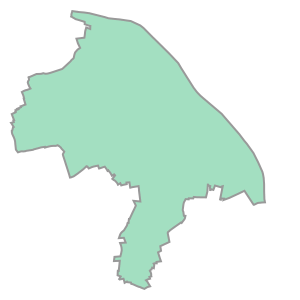

In [31]:
#extract population data for berlin
city.geometry[0]

In [32]:
# change crs to lat long
city_lat_long = ox.project_gdf(city, to_latlong=True)
pip_mask = gdf.within(city_lat_long.loc[0, 'geometry']) 

In [33]:
berlin_pop_gdf = gdf.loc[pip_mask]

<Axes: >

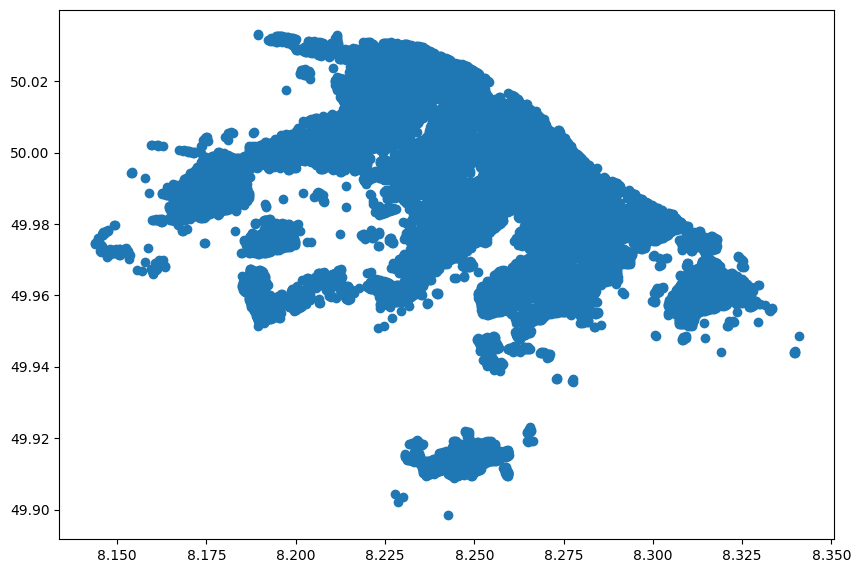

In [34]:
#plot population data with cmap
berlin_pop_gdf.plot(figsize=(10,10))

In [35]:
berlin_pop_gdf.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-population.csv")

In [36]:
# population for each grid
masks_pop = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = berlin_pop_gdf.within(city_polyframe_lat_long.loc[i, 'geometry'])
    masks_pop.append(pip_mask)

100%|██████████| 493/493 [00:00<00:00, 1714.43it/s]


In [37]:
pop_grid = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    pop_grid.append(berlin_pop_gdf.loc[masks_pop[i]].Population.mean())

In [38]:
pop_grid = np.nan_to_num(pop_grid)

In [39]:
berlin_polyframe_lat_long_new['population'] = pop_grid
berlin_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population
0,"POLYGON ((8.14309 49.97858, 8.14515 49.97893, ...",0,[],6.953169
1,"POLYGON ((8.14386 49.98241, 8.14352 49.98301, ...",0,[],0.000000
2,"POLYGON ((8.14995 49.97808, 8.15002 49.97370, ...",0,[],5.738533
3,"POLYGON ((8.15002 49.97370, 8.15010 49.96932, ...",0,[],6.953169
4,"POLYGON ((8.15010 49.96932, 8.15018 49.96494, ...",0,[],0.000000


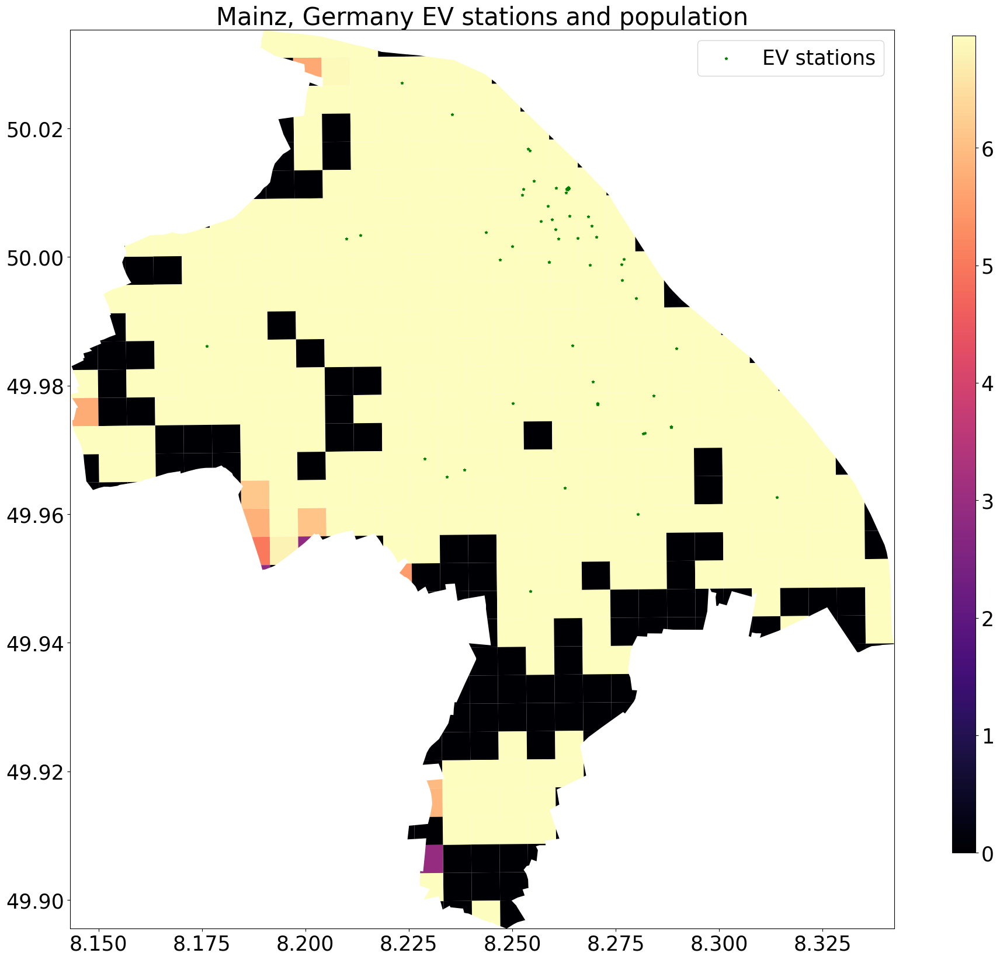

In [40]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'population', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} EV stations and population')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### LAnd_USE 

In [41]:
landuse = ox.geometries_from_place(PLACE_NAME, tags={'landuse': True})

# Define the categories
categories = {
    'residential': ['residential'],
    'commercial': ['commercial', 'retail', 'office', 'industrial'],
    'retail': ['retail'],
    'industrial': ['industrial']
}

# Create a new column to categorize the landuse types
landuse['category'] = 'Other'

# Iterate through the categories and assign the corresponding landuse types
for category, tags in categories.items():
    landuse.loc[landuse['landuse'].isin(tags), 'category'] = category

In [42]:
landuse.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-landuse.csv")

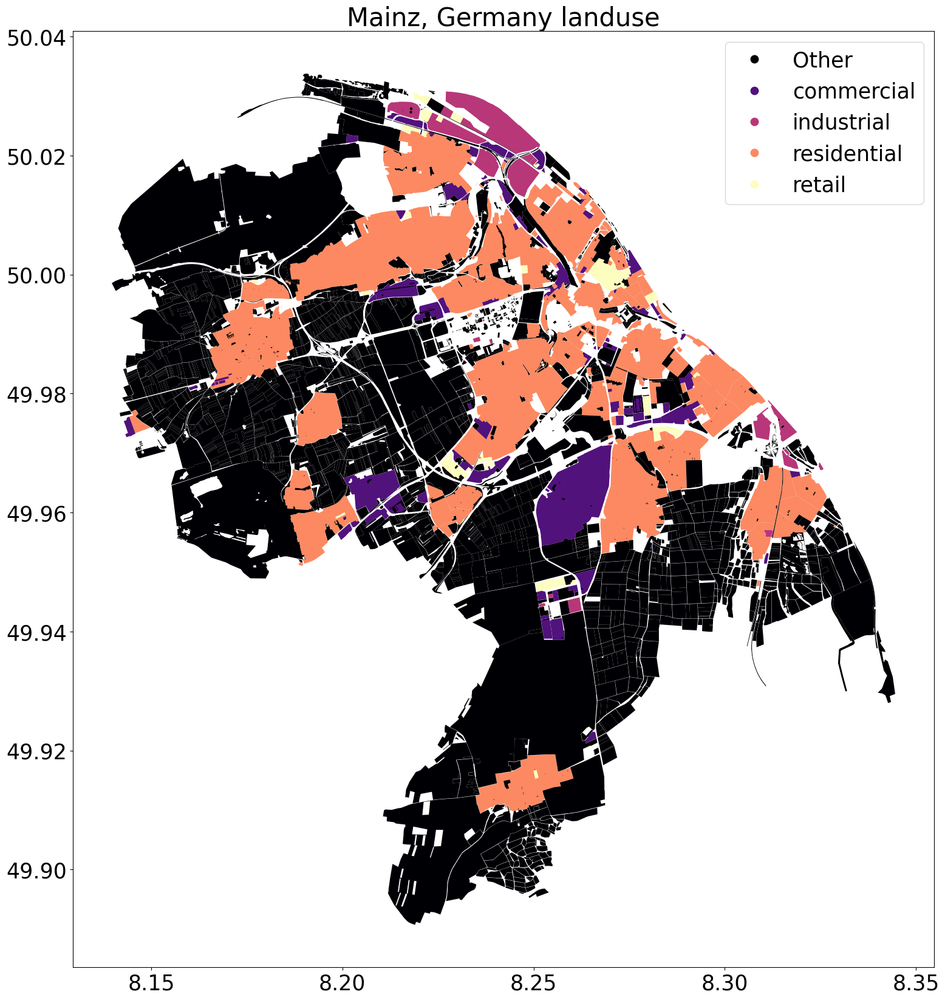

In [43]:
#plot node in landuse
fig, ax = plt.subplots(figsize=(20,20))
landuse.plot(ax=ax, column = 'category', legend=True, cmap='magma')
plt.title(f'{PLACE_NAME} landuse')
plt.show()

In [44]:
#create a copy of landuse drop everything except Category and geometry
landuse_cat = landuse[['category', 'geometry']].copy()

In [45]:
import shapely.speedups
shapely.speedups.enable()

/tmp/ipykernel_27419/3808896212.py:2: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()


In [46]:
masks_land_use = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = landuse_cat.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_land_use.append(pip_mask)
    assert pip_mask.shape[0] == landuse_cat.shape[0]

100%|██████████| 493/493 [00:00<00:00, 10723.89it/s]


In [47]:
land_labels = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    if landuse_cat[masks_land_use[i]].category.value_counts().isnull().all() == True:
        land_labels.append('Other')
    else:
        land_labels.append(landuse_cat[masks_land_use[i]].category.value_counts().index[0])

In [48]:
berlin_polyframe_lat_long_new['landuse'] = land_labels

In [49]:
berlin_polyframe_lat_long_new.landuse.value_counts()

landuse
Other          478
commercial       6
residential      5
industrial       4
Name: count, dtype: int64

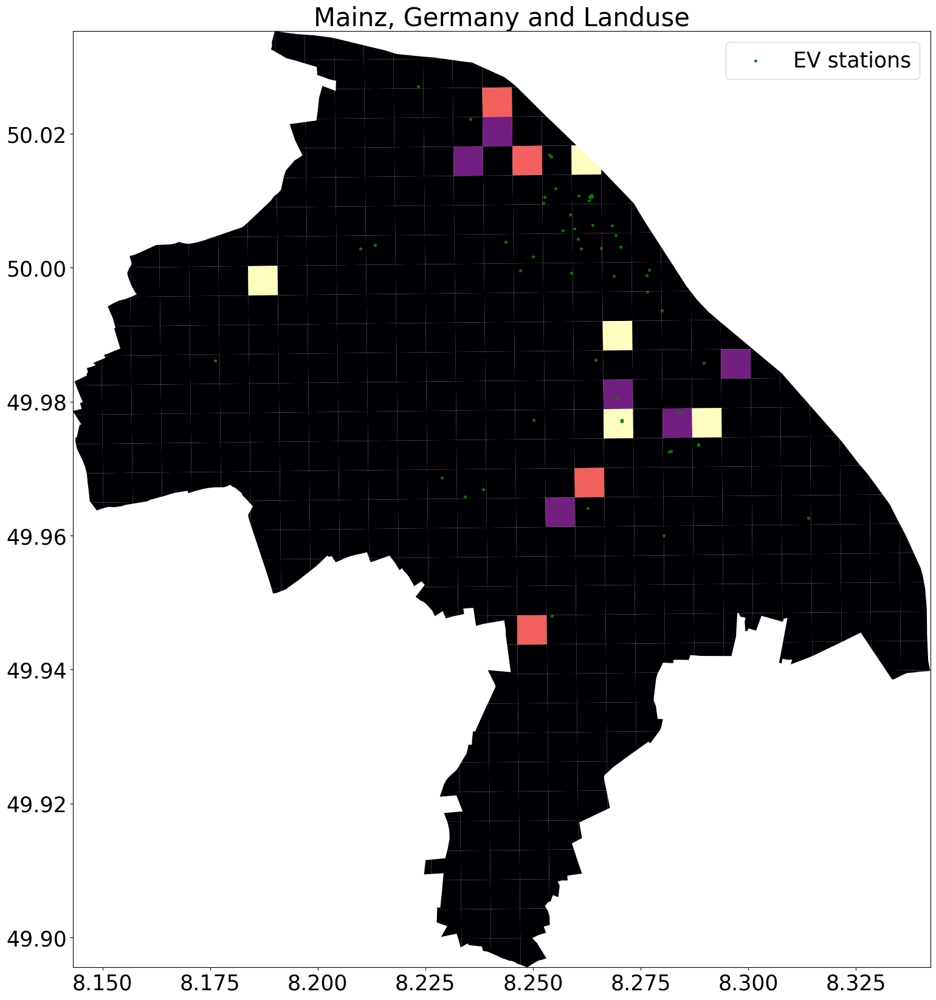

In [50]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'landuse', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
ax.legend()
# add legend
plt.title(f'{PLACE_NAME} and Landuse')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### Raod Connectivity

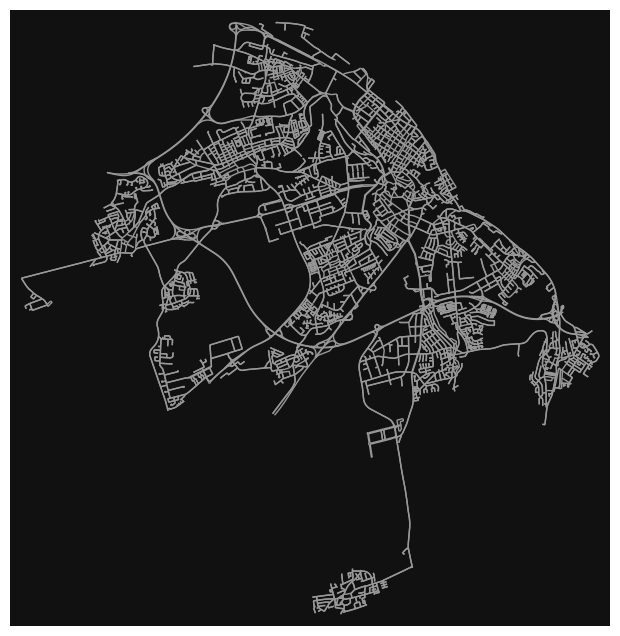

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [51]:
G = ox.graph_from_place(PLACE_NAME, network_type='drive')
ox.plot_graph(G, node_size= 0)

In [52]:
area,edges = ox.graph_to_gdfs(G)

In [55]:
# poly = city_polyframe_lat_long.loc[1254, 'geometry']
# G_1 = ox.graph_from_polygon(poly, network_type='drive')
# ox.plot_graph(G_1)

# #print number of nodes and edges and density
# print('Number of nodes in the graph: ', len(list(G_1.nodes())))
# print('Number of edges in the graph: ', len(list(G_1.edges())))
# print('Density of the graph: ', nx.density(G_1))

In [54]:
#calculate number of edges and nodes for each grid
nodes = []
edges = []
density = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    try: 
        poly = city_polyframe_lat_long.loc[i, 'geometry']
        G = ox.graph_from_polygon(poly, network_type='drive')
        nodes.append(len(list(G.nodes())))
        edges.append(len(list(G.edges())))
        density.append(nx.density(G))
    except:
        nodes.append(0)
        edges.append(0)
        density.append(0)


100%|██████████| 493/493 [03:55<00:00,  2.09it/s]


In [59]:
#add nodes, edges and density to the dataframe
berlin_polyframe_lat_long_new['nodes'] = nodes
berlin_polyframe_lat_long_new['edges'] = edges
berlin_polyframe_lat_long_new['density'] = density

In [60]:
berlin_polyframe_lat_long_new

,geometry,EV_stations_counts,EV_stations_geomery,population,landuse,nodes,edges,density
0,"POLYGON ((8.14309 49.97858, 8.14515 49.97893, ...",0,[],6.953169,Other,0,0,0.000000
1,"POLYGON ((8.14386 49.98241, 8.14352 49.98301, ...",0,[],0.000000,Other,0,0,0.000000
2,"POLYGON ((8.14995 49.97808, 8.15002 49.97370, ...",0,[],5.738533,Other,5,10,0.500000
3,"POLYGON ((8.15002 49.97370, 8.15010 49.96932, ...",0,[],6.953169,Other,6,10,0.333333
4,"POLYGON ((8.15010 49.96932, 8.15018 49.96494, ...",0,[],0.000000,Other,0,0,0.000000
...,...,...,...,...,...,...,...,...
488,"POLYGON ((8.19014 50.03223, 8.18972 50.03240, ...",0,[],6.953169,Other,0,0,0.000000
489,"POLYGON ((8.18448 49.96153, 8.18446 49.96157, ...",0,[],0.000000,Other,0,0,0.000000
490,"POLYGON ((8.15645 49.99778, 8.15621 49.99816, ...",0,[],0.000000,Other,0,0,0.000000
491,"POLYGON ((8.15633 50.00002, 8.15641 50.00010, ...",0,[],0.000000,Other,0,0,0.000000


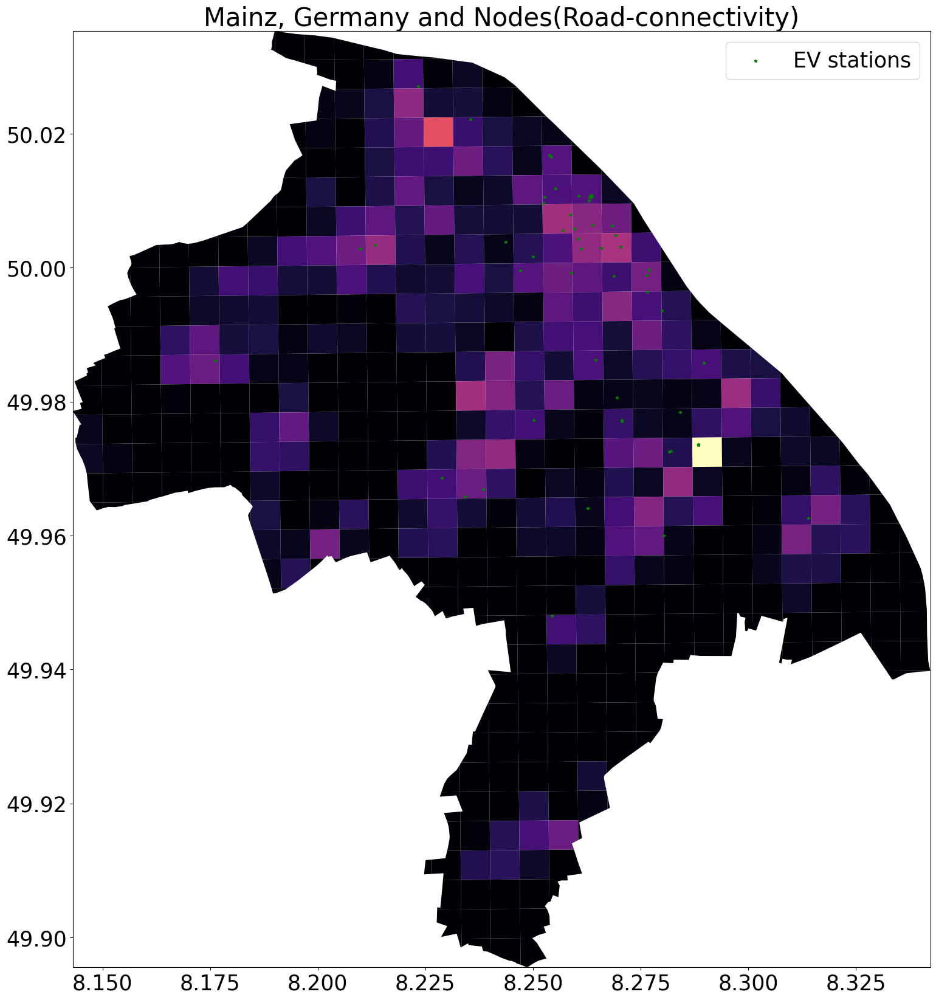

In [61]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'nodes', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Nodes(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

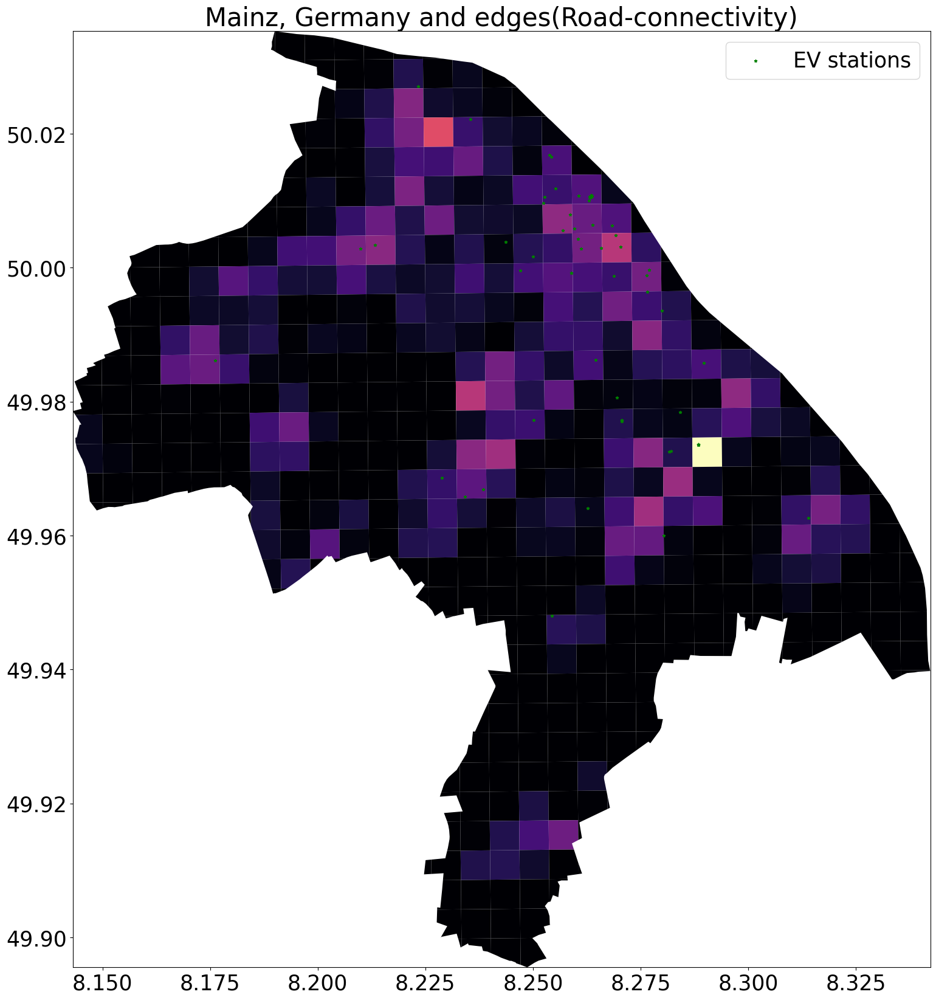

In [62]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'edges', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and edges(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

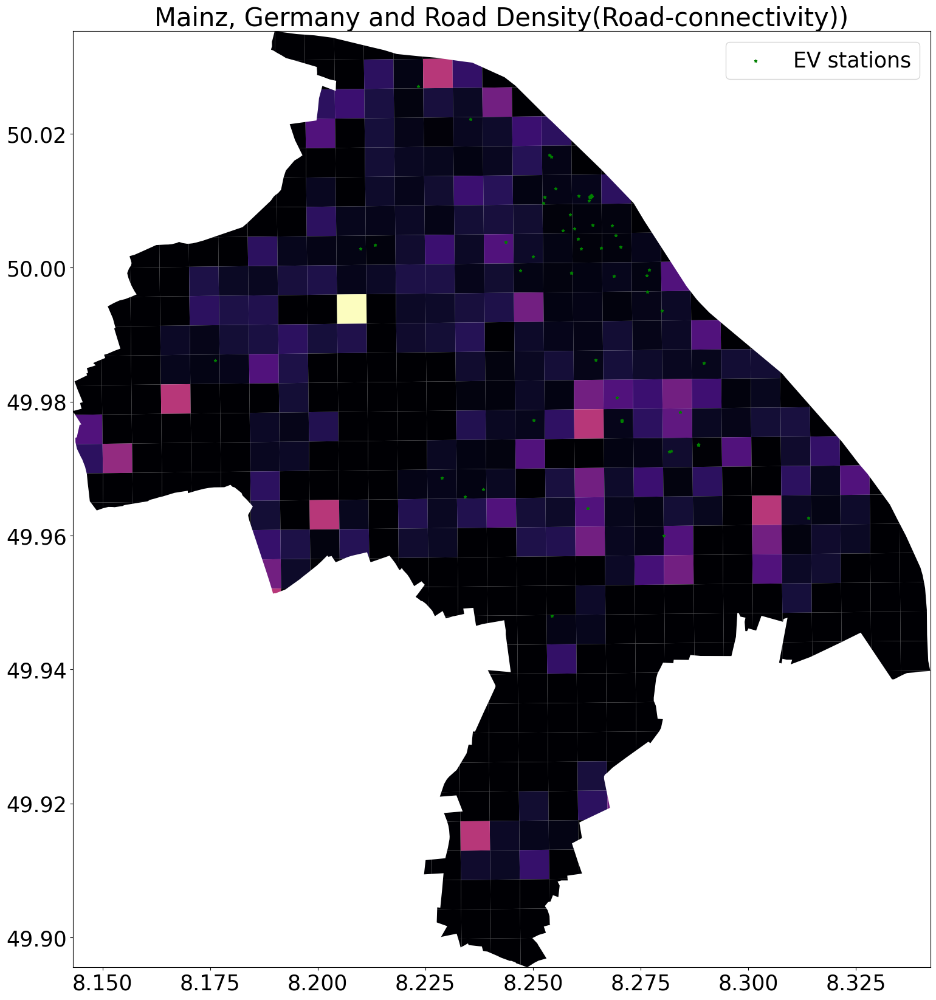

In [63]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'density', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road Density(Road-connectivity))')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

##### Parking

In [64]:
parking = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "parking"},
)
parking.head()
parking.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-parking.csv")

<Axes: >

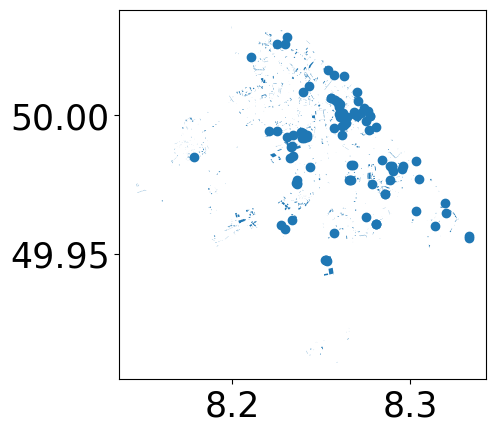

In [65]:
#parking spaces in the city
parking.plot()

In [66]:
#find parking spaces counts in the grid and their types
masks_parking = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = parking.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_parking.append(pip_mask)

100%|██████████| 493/493 [00:00<00:00, 15969.48it/s]


In [67]:
parking[masks_parking[1032]].shape[0]

IndexError: list index out of range

In [68]:
#parking space counts and types to the dataframe
parking_count = []
parking_types = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    parking_count.append(parking[masks_parking[i]].shape[0])
    parking_types.append(parking[masks_parking[i]].parking.value_counts().to_dict())

100%|██████████| 493/493 [00:00<00:00, 810.19it/s]


In [69]:
berlin_polyframe_lat_long_new['parking_count'] = parking_count
berlin_polyframe_lat_long_new['parking_types'] = parking_types

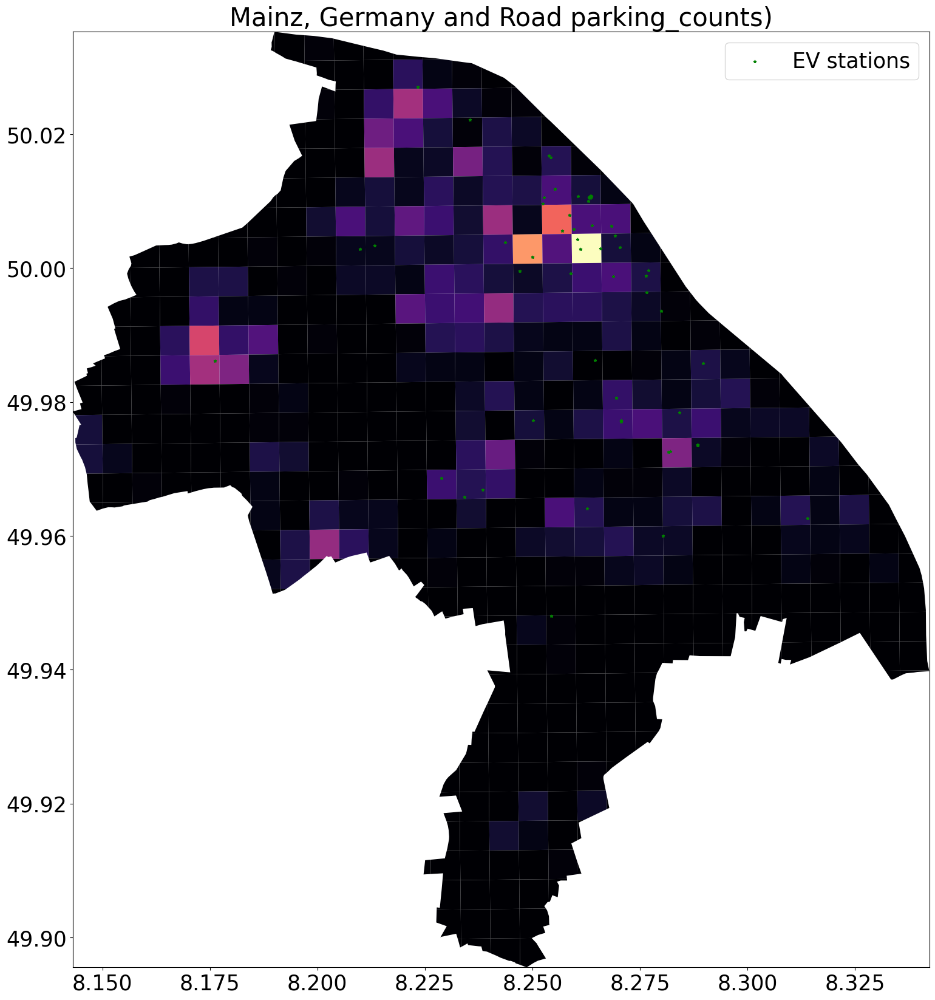

In [70]:
#relation between EV stations and parking spaces

plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'parking_count', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road parking_counts)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

In [71]:
#realation between EV stations and parking types
berlin_polyframe_lat_long_new[berlin_polyframe_lat_long_new['EV_stations_counts'] != 0].parking_types.value_counts()

#TO DO: PlOT the parking types with EV stations


parking_types
{'surface': 4}                                                                       3
{'surface': 1}                                                                       2
{'surface': 6, 'street_side': 2}                                                     2
{}                                                                                   2
{'lane': 10, 'surface': 7, 'street_side': 3, 'rooftop': 1}                           1
{'lane': 34, 'surface': 8, 'street_side': 7, 'underground': 2, 'multi-storey': 1}    1
{'surface': 6}                                                                       1
{'surface': 13, 'multi-storey': 3, 'street_side': 2, 'lane': 1}                      1
{'surface': 3, 'street_side': 2}                                                     1
{'underground': 1}                                                                   1
{'surface': 3, 'multi-storey': 1}                                                    1
{'surface': 4, 'street_side':

##### Resturants

In [72]:
restaurant = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "restaurant"},
)
restaurant.head()
restaurant.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-restaurant.csv")

<Axes: >

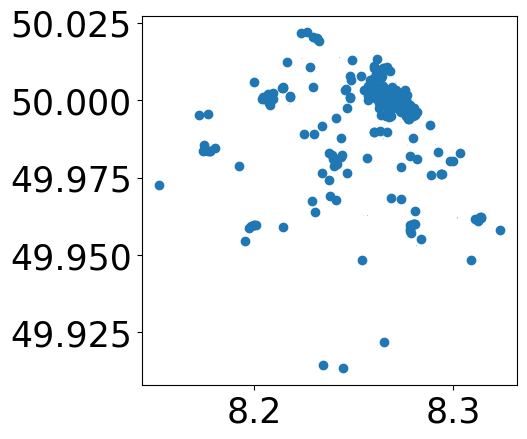

In [73]:
restaurant.plot()

In [74]:
list(restaurant.columns)

['addr:postcode',
 'amenity',
 'cuisine',
 'name',
 'opening_hours',
 'phone',
 'website',
 'geometry',
 'addr:city',
 'addr:country',
 'addr:housenumber',
 'addr:street',
 'brand',
 'brand:wikidata',
 'brand:wikipedia',
 'diet:vegan',
 'diet:vegetarian',
 'email',
 'indoor_seating',
 'operator',
 'outdoor_seating',
 'smoking',
 'takeaway',
 'wheelchair',
 'fax',
 'url',
 'contact:email',
 'contact:fax',
 'contact:phone',
 'toilets:wheelchair',
 'access:covid19',
 'description:covid19',
 'drive_through:covid19',
 'opening_hours:covid19',
 'takeaway:covid19',
 'check_date:opening_hours',
 'opening_hours:signed',
 'description',
 'wheelchair:description',
 'source',
 'created_by',
 'delivery:covid19',
 'reservation',
 'note',
 'survey:date',
 'check_date',
 'payment:credit_cards',
 'payment:maestro',
 'payment:mastercard',
 'payment:visa',
 'delivery',
 'diet:dairy_free',
 'diet:egg_free',
 'diet:lactose_free',
 'diet:pescetarian',
 'level',
 'tourism',
 'alt_name',
 'diet:gluten_free',


In [75]:
#find resturants counts in the grid and their types
masks_restaurant = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = restaurant.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_restaurant.append(pip_mask)



100%|██████████| 493/493 [00:00<00:00, 36375.97it/s]


In [76]:
#resturant counts and capacity to the dataframe
restaurant_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    restaurant_count.append(restaurant[masks_restaurant[i]].shape[0])

100%|██████████| 493/493 [00:00<00:00, 1446.11it/s]


In [77]:
berlin_polyframe_lat_long_new['restaurant_count'] = restaurant_count

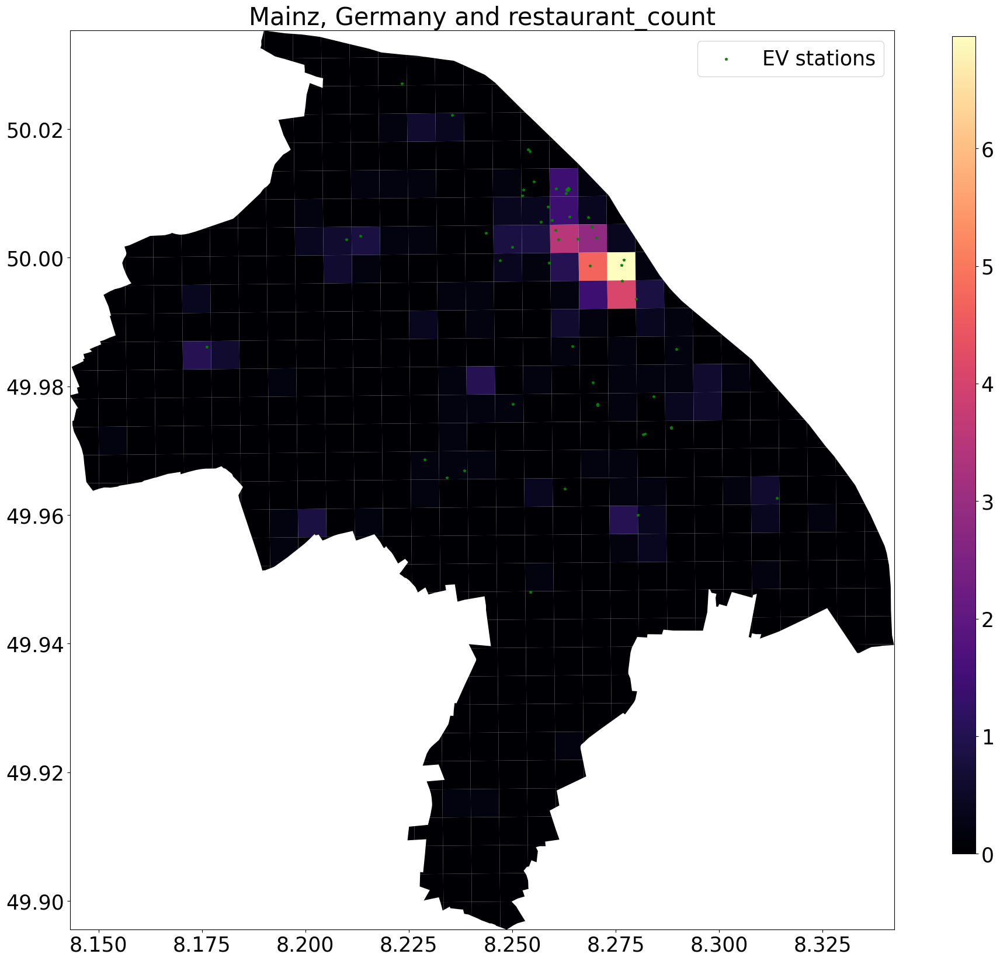

In [78]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'restaurant_count', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} and restaurant_count')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### library

In [79]:
#relation between EV stations and library
library = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "library"},
)
library.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-library.csv")
library.head()

amenity  \
element_type osmid                 
node         1735091776  library   
             3009687347  library   
             3381691071  library   
             3840707728  library   
             5335502435  library   

                                                                      name  \
element_type osmid                                                           
node         1735091776                       Bereichsbibliothek Theologie   
             3009687347           Bereichsbibliothek Georg Forster-Gebäude   
             3381691071                            Bereichsbibliothek ReWi   
             3840707728  Bereichsbibliothek Mathematik, Informatik und ...   
             5335502435                                           Bücherei   

                                                opening_hours wheelchair  \
element_type osmid                                                         
node         1735091776   Mo-Fr 08:00-22:00;Sa-Su 10:00-22:00        yes   
             3009687347              Mo-Fr 08:00-24:00, Sa-Su        yes   
             3381691071     Mo-Sa 08:00-22:00, Su 10:00-22:00        NaN   
             3840707728  Mo-Fr 08:00-22:00; Sa-Su 10:00-18:00        yes   
             5335502435     Su 10:30-12:30; Tu,Fr 15:30-17:30        NaN   

                                         geometry addr:city addr:housenumber  \
element_type osmid                                                             
node         1735091776  POINT (8.24390 49.99528)       NaN              NaN   
             3009687347  POINT (8.24083 49.99486)     Mainz               12   
             3381691071  POINT (8.24258 49.99390)       NaN              NaN   
             3840707728  POINT (8.23248 49.99131)       NaN              NaN   
             5335502435  POINT (8.31228 49.96240)       NaN              NaN   

                        addr:postcode       addr:street  check_date  ...  \
element_type osmid                                                   ...   
node         1735091776           NaN               NaN         NaN  ...   
             3009687347         55128  Jakob-Welder-Weg  2023-05-05  ...   
             3381691071           NaN               NaN         NaN  ...   
             3840707728           NaN               NaN         NaN  ...   
             5335502435           NaN               NaN         NaN  ...   

                        roof:levels wikipedia addr:country ways alt_name  \
element_type osmid                                                         
node         1735091776         NaN       NaN          NaN  NaN      NaN   
             3009687347         NaN       NaN          NaN  NaN      NaN   
             3381691071         NaN       NaN          NaN  NaN      NaN   
             3840707728         NaN       NaN          NaN  NaN      NaN   
             5335502435         NaN       NaN          NaN  NaN      NaN   

                        short_name type unimainz:buildingId  \
element_type osmid                                            
node         1735091776        NaN  NaN                 NaN   
             3009687347        NaN  NaN                 NaN   
             3381691071        NaN  NaN                 NaN   
             3840707728        NaN  NaN                 NaN   
             5335502435        NaN  NaN                 NaN   

                        wheelchair:description toilets:wheelchair  
element_type osmid                                                 
node         1735091776                    NaN                NaN  
             3009687347                    NaN                NaN  
             3381691071                    NaN                NaN  
             3840707728                    NaN                NaN  
             5335502435                    NaN                NaN  

[5 rows x 41 columns]

<Axes: >

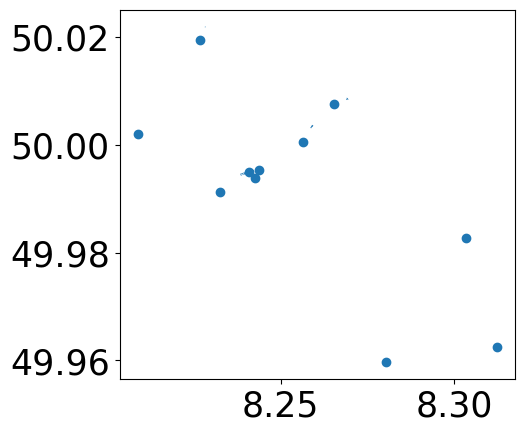

In [80]:
library.plot()

In [81]:
list(library.columns)

['amenity',
 'name',
 'opening_hours',
 'wheelchair',
 'geometry',
 'addr:city',
 'addr:housenumber',
 'addr:postcode',
 'addr:street',
 'check_date',
 'internet_access',
 'website',
 'operator',
 'operator:website',
 'phone',
 'survey:date',
 'nodes',
 'building:levels',
 'building',
 'check_date:opening_hours',
 'description',
 'email',
 'height',
 'internet_access:fee',
 'loc_name',
 'roof:material',
 'roof:shape',
 'wikidata',
 'construction_year',
 'ref:isil',
 'roof:colour',
 'roof:levels',
 'wikipedia',
 'addr:country',
 'ways',
 'alt_name',
 'short_name',
 'type',
 'unimainz:buildingId',
 'wheelchair:description',
 'toilets:wheelchair']

In [82]:
# find library counts in the grid
masks_library = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = library.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_library.append(pip_mask)

#library counts to the dataframe
library_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    library_count.append(library[masks_library[i]].shape[0])

berlin_polyframe_lat_long_new['library_count'] = library_count

100%|██████████| 493/493 [00:00<00:00, 1820.76it/s]


##### University

In [83]:
university = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "university"},
)
university.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-university.csv")
university.head()

geometry  \
element_type osmid                                                           
node         1788899260                           POINT (8.25783 49.99962)   
             7215719708                           POINT (8.25648 50.00050)   
way          155183071   POLYGON ((8.22834 49.98775, 8.22841 49.98777, ...   
             479815015   POLYGON ((8.25277 49.99658, 8.25269 49.99659, ...   
relation     8061090     MULTIPOLYGON (((8.25636 50.00110, 8.25658 50.0...   

                        addr:postcode     amenity  \
element_type osmid                                  
node         1788899260         55122  university   
             7215719708           NaN  university   
way          155183071            NaN  university   
             479815015          55131  university   
relation     8061090              NaN  university   

                                                                      name  \
element_type osmid                                                           
node         1788899260                Psychologisches Institut, Uni Mainz   
             7215719708  JGU - Fachbereich Katholische und evangelische...   
way          155183071                  Hochschule Mainz - Standort Campus   
             479815015                        Katholische Hochschule Mainz   
relation     8061090                  Johannes Gutenberg-Universität Mainz   

                        wheelchair        wheelchair:description  \
element_type osmid                                                 
node         1788899260        yes  Zugang über Einkaufspassage.   
             7215719708        yes                           NaN   
way          155183071         yes                           NaN   
             479815015         NaN                           NaN   
relation     8061090           NaN                           NaN   

                        toilets:wheelchair  \
element_type osmid                           
node         1788899260                NaN   
             7215719708                yes   
way          155183071                 yes   
             479815015                 NaN   
relation     8061090                   NaN   

                                                                     nodes  \
element_type osmid                                                           
node         1788899260                                                NaN   
             7215719708                                                NaN   
way          155183071   [1676015126, 6837547030, 1676015129, 167601513...   
             479815015   [5327113477, 5327104072, 5327104074, 532710408...   
relation     8061090     [[[2483426646, 2483426655, 2272801309, 2483426...   

                                 operator        contact:email  ...  \
element_type osmid                                              ...   
node         1788899260               NaN                  NaN  ...   
             7215719708               NaN                  NaN  ...   
way          155183071   Hochschule Mainz  kontakt@hs-mainz.de  ...   
             479815015                NaN                  NaN  ...   
relation     8061090                  NaN                  NaN  ...   

                        addr:housenumber  \
element_type osmid                         
node         1788899260              NaN   
             7215719708              NaN   
way          155183071               NaN   
             479815015                 1   
relation     8061090                 NaN   

                                                                      ways  \
element_type osmid                                                           
node         1788899260                                                NaN   
             7215719708                                                NaN   
way          155183071                                                 NaN   
             479815015                                  

<Axes: >

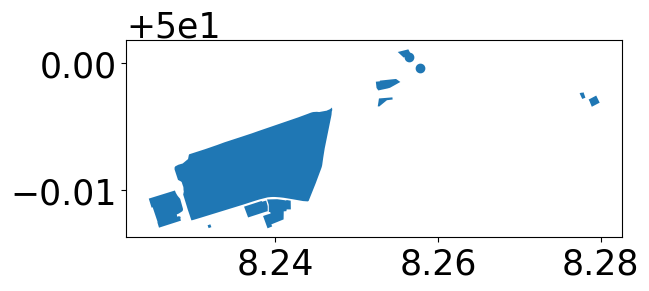

In [84]:
university.plot()

In [85]:
# find university counts in the grid
masks_university = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = university.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_university.append(pip_mask)

#university counts to the dataframe
university_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    university_count.append(university[masks_university[i]].shape[0])

berlin_polyframe_lat_long_new['university_count'] = university_count


100%|██████████| 493/493 [00:00<00:00, 1959.42it/s]


##### School

In [86]:
school = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "school"},
)
school.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-school.csv")
school.head()

geometry barrier amenity  \
element_type osmid                                                  
node         356925159   POINT (8.25707 49.99907)     NaN  school   
             6569398540  POINT (8.26038 49.99314)     NaN  school   
             7618632446  POINT (8.27017 49.99604)     NaN  school   
             7620575078  POINT (8.26964 49.99732)     NaN  school   
             8179960191  POINT (8.22437 50.00303)     NaN  school   

                        check_date:opening_hours education  \
element_type osmid                                           
node         356925159                2023-05-03     music   
             6569398540                      NaN       NaN   
             7618632446                      NaN       NaN   
             7620575078                      NaN       NaN   
             8179960191                      NaN       NaN   

                                                          name  \
element_type osmid                                               
node         356925159          Peter-Cornelius-Konservatorium   
             6569398540                            MTAL-Schule   
             7618632446  Bischöfliche Willigis Realschule Plus   
             7620575078                      Maria-Ward-Schule   
             8179960191                    Peter-Jordan-Schule   

                                          office opening_hours:signed  \
element_type osmid                                                      
node         356925159   educational_institution                   no   
             6569398540                      NaN                  NaN   
             7618632446                      NaN                  NaN   
             7620575078                      NaN                  NaN   
             8179960191                      NaN                  NaN   

                                                                   website  \
element_type osmid                                                           
node         356925159        http://www.peter-cornelius-konservatorium.de   
             6569398540  http://www.unimedizin-mainz.de/mtal/uebersicht...   
             7618632446                                                NaN   
             7620575078                                                NaN   
             8179960191            http://www.peter-jordan-schule-mainz.de   

                         wikidata  ... old_name short_name landuse start_date  \
element_type osmid                 ...                                          
node         356925159   Q2073392  ...      NaN        NaN     NaN        NaN   
             6569398540       NaN  ...      NaN        NaN     NaN        NaN   
             7618632446       NaN  ...      NaN        NaN     NaN        NaN   
             7620575078       NaN  ...      NaN        NaN     NaN        NaN   
             8179960191       NaN  ...      NaN        NaN     NaN        NaN   

                        designation source addr:housename level school:type  \
element_type osmid                                                            
node         356925159          NaN    NaN            NaN   NaN         NaN   
             6569398540         NaN    NaN            NaN   NaN         NaN   
             7618632446         NaN    NaN            NaN   NaN         NaN   
             7620575078         NaN    NaN            NaN   NaN         NaN   
             8179960191         NaN    NaN            NaN   NaN         NaN   

                        ways  
element_type osmid            
node         356925159   NaN  
             6569398540  NaN  
             7618632446  NaN  
             7620575078  NaN  
             8179960191  NaN  

[5 rows x 56 columns]

<Axes: >

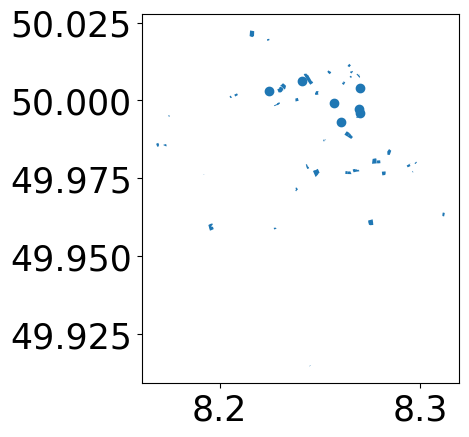

In [87]:
school.plot()

In [88]:
# find school counts in the grid
masks_school = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = school.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_school.append(pip_mask)

#school counts to the dataframe
school_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    school_count.append(school[masks_school[i]].shape[0])

berlin_polyframe_lat_long_new['school_count'] = school_count


100%|██████████| 493/493 [00:00<00:00, 1767.22it/s]


##### Leisure = park

In [89]:
park = ox.geometries_from_place(
    PLACE_NAME,
    {"leisure": "park"},
)

park.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-park.csv")
park.head()


geometry  \
element_type osmid                                                            
node         9852869244                            POINT (8.21642 50.01870)   
             10839574669                           POINT (8.22273 50.01360)   
way          4514821      POLYGON ((8.26417 49.99400, 8.26423 49.99376, ...   
             23575709     POLYGON ((8.25561 50.01097, 8.25499 50.01126, ...   
             23578507     POLYGON ((8.25109 50.01292, 8.25205 50.01247, ...   

                         natural barrier                         name  \
element_type osmid                                                      
node         9852869244      NaN     NaN                Am Roten Berg   
             10839574669     NaN     NaN  Mombacher TV - Tennisanlage   
way          4514821         NaN     NaN                          NaN   
             23575709        NaN     NaN                  Goetheplatz   
             23578507        NaN     NaN                Valenciaplatz   

                         wheelchair access opening_hours      operator  \
element_type osmid                                                       
node         9852869244         NaN    NaN           NaN   Stadt Mainz   
             10839574669        NaN    NaN           NaN  Mombacher TV   
way          4514821            NaN    NaN           NaN           NaN   
             23575709           NaN    NaN           NaN           NaN   
             23578507           NaN    NaN           NaN           NaN   

                                                      website leisure  ...  \
element_type osmid                                                     ...   
node         9852869244                                   NaN    park  ...   
             10839574669  https://www.mtv-tennisabteilung.de/    park  ...   
way          4514821                                      NaN    park  ...   
             23575709                                     NaN    park  ...   
             23578507                                     NaN    park  ...   

                          lit surface leaf_type place note loc_name  \
element_type osmid                                                    
node         9852869244   NaN     NaN       NaN   NaN  NaN      NaN   
             10839574669  NaN     NaN       NaN   NaN  NaN      NaN   
way          4514821      NaN     NaN       NaN   NaN  NaN      NaN   
             23575709     NaN     NaN       NaN   NaN  NaN      NaN   
             23578507     NaN     NaN       NaN   NaN  NaN      NaN   

                         start_date fixme ways type  
element_type osmid                                   
node         9852869244         NaN   NaN  NaN  NaN  
             10839574669        NaN   NaN  NaN  NaN  
way          4514821            NaN   NaN  NaN  NaN  
             23575709           NaN   NaN  NaN  NaN  
             23578507           NaN   NaN  NaN  NaN  

[5 rows x 34 columns]

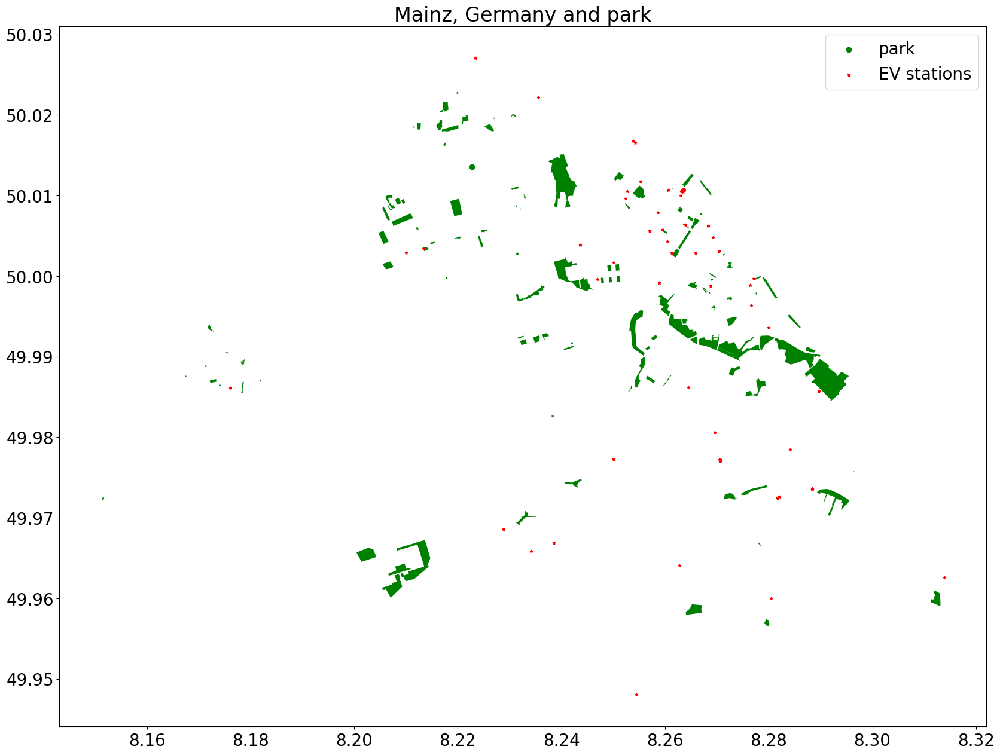

In [90]:
#plot the park data 

plt.rcParams.update({'font.size':20})
fig, ax = plt.subplots(figsize=(20,20))
park.plot(ax=ax, legend=False, color='green')
plt.title(f'{PLACE_NAME} and park')

# add EV stations
EV_stations.plot(ax=ax, color='red', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['park', 'EV stations'])

In [91]:
# find park counts in the grid
masks_park = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = park.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_park.append(pip_mask)

#park counts to the dataframe
park_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    park_count.append(park[masks_park[i]].shape[0])

berlin_polyframe_lat_long_new['park_count'] = park_count

100%|██████████| 493/493 [00:00<00:00, 1919.31it/s]


##### Leisure = Cinema

In [92]:
cinema = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "cinema"},
)
cinema.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-cinema.csv")
cinema.head()

addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                              
node         878722580      Mainz           DE                9         55116   
             1720016527     Mainz           DE              6-8         55116   
             3177863062     Mainz          NaN               11         55116   
way          24343712       Mainz          NaN                1         55116   

                              addr:street amenity  \
element_type osmid                                  
node         878722580   Neubrunnenstraße  cinema   
             1720016527   Hintere Bleiche  cinema   
             3177863062     Schillerplatz  cinema   
way          24343712       Holzhofstraße  cinema   

                                                       email  \
element_type osmid                                             
node         878722580   reservierung@programmkinos-mainz.de   
             1720016527  reservierung@programmkinos-mainz.de   
             3177863062                                  NaN   
way          24343712                                    NaN   

                                                               information  \
element_type osmid                                                           
node         878722580   Büro: Tel:06131-21 33 47 1, info@programmkinos...   
             1720016527  Büro: Tel:06131-21 33 47 1, info@programmkinos...   
             3177863062                                                NaN   
way          24343712                                                  NaN   

                                   name                    opening_hours  ...  \
element_type osmid                                                        ...   
node         878722580          Capitol  "Offen bei Vorführungen (Kino)"  ...   
             1720016527         Palatin          "30 min before showing"  ...   
             3177863062    Ciné Mayence                              NaN  ...   
way          24343712    Cinestar Mainz               Mo-Su 11:00-18:00+  ...   

                          wikidata  \
element_type osmid                   
node         878722580   Q50843735   
             1720016527  Q50843738   
             3177863062  Q50843736   
way          24343712    Q50843737   

                                                                  geometry  \
element_type osmid                                                           
node         878722580                            POINT (8.26464 50.00246)   
             1720016527                           POINT (8.26341 50.00150)   
             3177863062                           POINT (8.26607 49.99906)   
way          24343712    POLYGON ((8.27858 49.99355, 8.27858 49.99359, ...   

                        opening_hours:signed  \
element_type osmid                             
node         878722580                   NaN   
             1720016527                  NaN   
             3177863062                   no   
way          24343712                    NaN   

                                                                     nodes  \
element_type osmid                                                           
node         878722580                                                 NaN   
             1720016527                                                NaN   
             3177863062                                                NaN   
way          24343712    [264096190, 1156244785, 1156245062, 9253428992...   

                            brand brand:wikidata brand:wikipedia building  \
element_type osmid                                                          
node         878722580        NaN            NaN             NaN      NaN   
             1720016527       NaN            NaN             NaN      NaN   
             3177863062       NaN            NaN             NaN      NaN   
way          24343712    CineStar   

<Axes: >

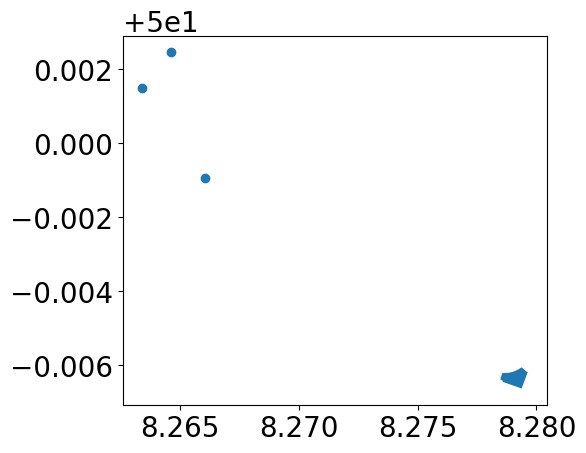

In [93]:
cinema.plot()

In [94]:
# find cinema counts in the grid
masks_cinema = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = cinema.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_cinema.append(pip_mask)

#cinema counts to the dataframe
cinema_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    cinema_count.append(cinema[masks_cinema[i]].shape[0])

100%|██████████| 493/493 [00:00<00:00, 1974.06it/s]


##### Townhall

In [95]:
townhall = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "townhall"},
)
townhall.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-townhall.csv")
townhall.head()

amenity  \
element_type osmid                  
node         1250000610  townhall   
             1797811392  townhall   
             1797811400  townhall   
             1797811404  townhall   
             1797811405  townhall   

                                                                      name  \
element_type osmid                                                           
node         1250000610                          Katholisches Pfarrzentrum   
             1797811392  Stadtverwaltung Mainz, Ortsverwaltung-Mainz-He...   
             1797811400                              Stadtverwaltung Mainz   
             1797811404  Stadtverwaltung Mainz, Ortsverwaltung Mainz-We...   
             1797811405                    Ortsverwaltung Mainz-Laubenheim   

                        wheelchair                  geometry  \
element_type osmid                                             
node         1250000610        yes  POINT (8.31163 49.96235)   
             1797811392    limited  POINT (8.28035 49.95972)   
             1797811400        yes  POINT (8.24402 49.91326)   
             1797811404        yes  POINT (8.30364 49.98256)   
             1797811405        yes  POINT (8.31227 49.96251)   

                                                             opening_hours  \
element_type osmid                                                           
node         1250000610                                                NaN   
             1797811392          Tu-Fr 07:30-12:00; Tu 15:00-18:00; Mo off   
             1797811400                  Mo-Fr 08:00-12:00; Tu 17:30-19:00   
             1797811404  Mo-We 08:30-13:00; Th 14:00-18:00; Fr 08:30-12:00   
             1797811405       Mo,We-Fr 08:30-11:30, Mo 16:00-17:45; Tu off   

                                                                   website  \
element_type osmid                                                           
node         1250000610                                                NaN   
             1797811392  http://www.mainz.de/WGAPublisher/online/html/d...   
             1797811400                      http://www.mainz.de/index.php   
             1797811404  http://www.mainz.de/WGAPublisher/online/html/d...   
             1797811405  http://www.mz-laubenheim.de/mz-laubenheim/oeff...   

                        addr:city addr:housenumber addr:postcode  addr:street  \
element_type osmid                                                              
node         1250000610       NaN              NaN           NaN          NaN   
             1797811392       NaN              NaN           NaN          NaN   
             1797811400     Mainz               17         55129  Römerstraße   
             1797811404       NaN              NaN           NaN          NaN   
             1797811405       NaN              NaN           NaN          NaN   

                         ... building:part image wikidata wikimedia_commons  \
element_type osmid       ...                                                  
node         1250000610  ...           NaN   NaN      NaN               NaN   
             1797811392  ...           NaN   NaN      NaN               NaN   
             1797811400  ...           NaN   NaN      NaN               NaN   
             1797811404  ...           NaN   NaN      NaN               NaN   
             1797811405  ...           NaN   NaN      NaN               NaN   

                        wikipedia year_of_construction building ways  \
element_type osmid                                                     
node         1250000610       NaN                  NaN      NaN  NaN   
             1797811392       NaN                  NaN      NaN  NaN   
             1797811400       NaN                  NaN      NaN  NaN   
             1797811404       NaN                  NaN      NaN  NaN   
             1797811405       NaN                  NaN      NaN  NaN   

                        start_date type  
element

<Axes: >

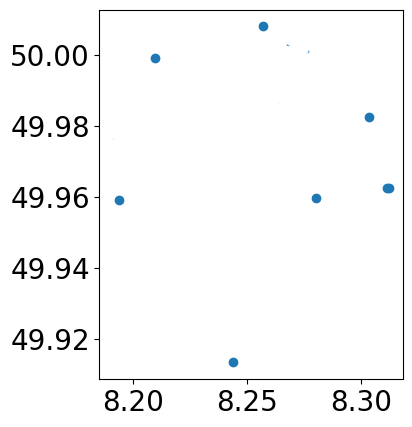

In [96]:
townhall.plot()

In [97]:
# find townhall counts in the grid
masks_townhall = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = townhall.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_townhall.append(pip_mask)

#townhall counts to the dataframe
townhall_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    townhall_count.append(townhall[masks_townhall[i]].shape[0])

berlin_polyframe_lat_long_new['townhall_count'] = townhall_count


100%|██████████| 493/493 [00:00<00:00, 1872.62it/s]


##### Community_centre

In [98]:
Community_centre = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "community_centre"},
)
Community_centre.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-Community_centre.csv")
Community_centre.head()

amenity community_centre  \
element_type osmid                                           
node         378251195   community_centre  cultural_centre   
             4581750308  community_centre              NaN   
             4794842223  community_centre              NaN   
             5141243660  community_centre              NaN   
             5247961442  community_centre              NaN   

                                              name                  geometry  \
element_type osmid                                                             
node         378251195                 Kulturhalle  POINT (8.22620 49.95766)   
             4581750308  Stadtteiltreff Gonsenheim  POINT (8.20856 50.00822)   
             4794842223         Römerquellen-Treff  POINT (8.17650 49.99577)   
             5141243660              Stadtteilbüro  POINT (8.25552 50.01237)   
             5247961442      Jugendzentrum Lionhof  POINT (8.14606 49.97249)   

                                                       opening_hours  \
element_type osmid                                                     
node         378251195                                           NaN   
             4581750308                            Mo-Th 14:00-17:00   
             4794842223                                          NaN   
             5141243660  "nach Vereinbarung unter +49 6131 12 41 15"   
             5247961442                                          NaN   

                                      phone  \
element_type osmid                            
node         378251195                  NaN   
             4581750308     +49 6131 687501   
             4794842223                 NaN   
             5141243660  +49 6131 60 29 840   
             5247961442                 NaN   

                                                          website addr:city  \
element_type osmid                                                            
node         378251195                                        NaN       NaN   
             4581750308  http://www.stadtteiltreff-gonsenheim.de/       NaN   
             4794842223                                       NaN       NaN   
             5141243660       https://www.soziale-stadt-mainz.de/     Mainz   
             5247961442                                       NaN       NaN   

                        addr:country addr:housenumber  ... roof:colour  \
element_type osmid                                     ...               
node         378251195           NaN              NaN  ...         NaN   
             4581750308          NaN              NaN  ...         NaN   
             4794842223          NaN              NaN  ...         NaN   
             5141243660           DE               35  ...         NaN   
             5247961442          NaN              NaN  ...         NaN   

                        roof:shape  fax internet_access internet_access:fee  \
element_type osmid                                                            
node         378251195         NaN  NaN             NaN                 NaN   
             4581750308        NaN  NaN             NaN                 NaN   
             4794842223        NaN  NaN             NaN                 NaN   
             5141243660        NaN  NaN             NaN                 NaN   
             5247961442        NaN  NaN             NaN                 NaN   

                        smoking social_facility social_facility:for  \
element_type osmid                                                    
node         378251195      NaN             NaN                 NaN   
             4581750308     NaN             NaN                 NaN   
             4794842223     NaN             NaN                 NaN   
             5141243660     NaN             NaN                 NaN   
             5247961442     NaN             NaN                 NaN   

                        description contact:phone  
element_type osmid        

In [99]:
# find Community_centre counts in the grid
masks_Community_centre = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = Community_centre.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_Community_centre.append(pip_mask)

#Community_centre counts to the dataframe
Community_centre_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    Community_centre_count.append(Community_centre[masks_Community_centre[i]].shape[0])

100%|██████████| 493/493 [00:00<00:00, 1911.24it/s]


In [100]:
berlin_polyframe_lat_long_new['Community_centre_count'] = Community_centre_count

##### Building = Geovenment 

In [101]:
government = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "government"},
)

government.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-government_building.csv")
government.head()

addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                             
way          23643771        NaN          NaN              NaN           NaN   
             23643772        NaN          NaN              NaN           NaN   
             79250179      Mainz           DE                6         55116   
             116718251     Mainz           DE               14         55130   
             141131876     Mainz          NaN               38         55127   

                                     addr:street  \
element_type osmid                                 
way          23643771                        NaN   
             23643772                        NaN   
             79250179         Schießgartenstraße   
             116718251  Wilhelm-Leuschner-Straße   
             141131876           Im Borner Grund   

                                                                 geometry  \
element_type osmid                                                          
way          23643771   POLYGON ((8.27123 50.00551, 8.27126 50.00548, ...   
             23643772   POLYGON ((8.27158 50.00520, 8.27166 50.00511, ...   
             79250179   POLYGON ((8.26606 50.00451, 8.26574 50.00418, ...   
             116718251  POLYGON ((8.31226 49.96216, 8.31239 49.96214, ...   
             141131876  POLYGON ((8.22741 49.96026, 8.22733 49.96039, ...   

                                                                    nodes  \
element_type osmid                                                          
way          23643771   [256144187, 1635811704, 256144188, 256144189, ...   
             23643772   [256144202, 256144201, 256144200, 256144203, 2...   
             79250179   [925662864, 925662856, 925662905, 925662862, 9...   
             116718251  [1315151607, 5333203562, 5333203556, 533320355...   
             141131876  [1544913764, 1544913786, 1544913791, 154491378...   

                          building building:colour building:levels  \
element_type osmid                                                   
way          23643771   government         #b9817b               2   
             23643772   government         #b9817b               2   
             79250179   government             NaN             NaN   
             116718251  government             NaN             NaN   
             141131876  government             NaN             NaN   

                       roof:levels roof:material roof:shape  \
element_type osmid                                            
way          23643771            2         slate    mansard   
             23643772            2         slate    mansard   
             79250179          NaN           NaN        NaN   
             116718251         NaN           NaN        NaN   
             141131876         NaN           NaN        NaN   

                                                   name      office club  \
element_type osmid                                                         
way          23643771                               NaN         NaN  NaN   
             23643772                               NaN         NaN  NaN   
             79250179   Amt für soziale Angelegenheiten  government  NaN   
             116718251               Wilhelm-Spieß-Haus         NaN  NaN   
             141131876                              NaN         NaN  NaN   

                       email phone website  
element_type osmid                          
way          23643771    NaN   NaN     NaN  
             23643772    NaN   NaN     NaN  
             79250179    NaN   NaN     NaN  
             116718251   NaN   NaN     NaN  
             141131876   NaN   NaN     NaN

<Axes: >

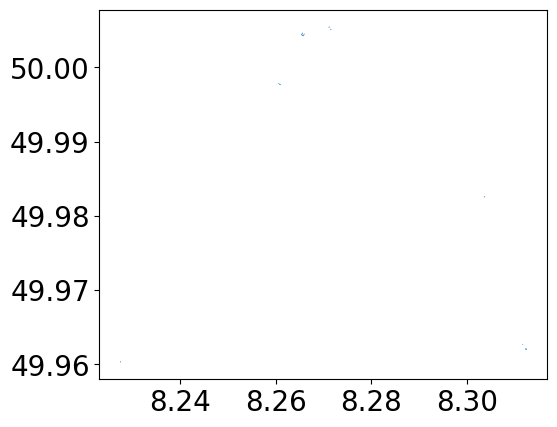

In [102]:
government.plot()

In [103]:
# find government counts in the grid
masks_government = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = government.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_government.append(pip_mask)

#government counts to the dataframe
government_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    government_count.append(government[masks_government[i]].shape[0])

berlin_polyframe_lat_long_new['government_count'] = government_count


100%|██████████| 493/493 [00:00<00:00, 1928.12it/s]


##### Building=civic 

In [104]:
civic = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "civic"},
)

civic.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-civic_building.csv")
civic.head()

geometry  \
element_type osmid                                                         
way          23660418  POLYGON ((8.27319 49.99363, 8.27331 49.99355, ...   
             23660419  POLYGON ((8.27422 49.99260, 8.27444 49.99244, ...   
             23660420  POLYGON ((8.27326 49.99340, 8.27391 49.99293, ...   
             23660421  POLYGON ((8.27186 49.99330, 8.27245 49.99302, ...   
             24163934  POLYGON ((8.25689 49.99883, 8.25685 49.99885, ...   

                      wheelchair  \
element_type osmid                 
way          23660418        yes   
             23660419        yes   
             23660420        yes   
             23660421        NaN   
             24163934        NaN   

                                                                   nodes  \
element_type osmid                                                         
way          23660418  [267037520, 530678311, 256344376, 256344379, 2...   
             23660419  [256344382, 256344387, 5409849232, 5409849234,...   
             23660420  [267037524, 267037523, 5409849244, 722281505, ...   
             23660421  [256344410, 256344407, 256344403, 256344413, 2...   
             24163934  [261732432, 8766147821, 8766147820, 8766147819...   

                      building building:levels layer  \
element_type osmid                                     
way          23660418    civic               2     1   
             23660419    civic               2     1   
             23660420    civic               3     1   
             23660421    civic             NaN     1   
             24163934    civic               6   NaN   

                                                   name  ref roof:levels  \
element_type osmid                                                         
way          23660418                             Bau B    B           2   
             23660419                             Bau C    C           2   
             23660420                             Bau E    E           1   
             23660421  Bau F / Franz Adam Landvogt-Haus  NaN         NaN   
             24163934                               NaN  NaN           0   

                      roof:material  ... addr:housenumber addr:postcode  \
element_type osmid                   ...                                  
way          23660418         slate  ...              NaN           NaN   
             23660419         slate  ...              NaN           NaN   
             23660420         slate  ...              NaN           NaN   
             23660421           NaN  ...              1 F         55131   
             24163934           NaN  ...              NaN           NaN   

                      addr:street start_date source:geometry nohousenumber  \
element_type osmid                                                           
way          23660418         NaN        NaN             NaN           NaN   
             23660419         NaN        NaN             NaN           NaN   
             23660420         NaN        NaN             NaN           NaN   
             23660421   Zitadelle        NaN             NaN           NaN   
             24163934         NaN       2008             NaN           NaN   

                      addr:country ways building:colour type  
element_type osmid                                            
way          23660418          NaN  NaN             NaN  NaN  
             23660419          NaN  NaN             NaN  NaN  
             23660420          NaN  NaN             NaN  NaN  
             23660421          NaN  NaN             NaN  NaN  
             24163934          NaN  NaN             NaN  NaN  

[5 rows x 22 columns]

<Axes: >

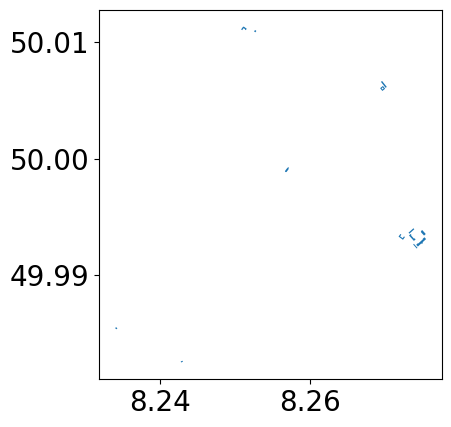

In [105]:
civic.plot()

In [106]:
# find civic counts in the grid
masks_civic = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = civic.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_civic.append(pip_mask)

#civic counts to the dataframe
civic_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    civic_count.append(civic[masks_civic[i]].shape[0])

berlin_polyframe_lat_long_new['civic_count'] = civic_count

100%|██████████| 493/493 [00:00<00:00, 1990.72it/s]


##### building=commercial

In [107]:
commercial = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "commercial"},
)
commercial.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-commercial_building.csv")
commercial.head()


geometry  \
element_type osmid                                                         
way          23578481  POLYGON ((8.25699 49.99962, 8.25709 49.99968, ...   
             23578482  POLYGON ((8.25659 50.00148, 8.25696 50.00162, ...   
             23597782  POLYGON ((8.23614 50.02288, 8.23553 50.02239, ...   
             23645721  POLYGON ((8.27510 50.00241, 8.27514 50.00243, ...   
             24094183  POLYGON ((8.24746 50.00147, 8.24816 50.00151, ...   

                                 amenity wheelchair brand brand:wikidata  \
element_type osmid                                                         
way          23578481                NaN        yes   NaN            NaN   
             23578482                NaN        NaN   NaN            NaN   
             23597782                NaN        NaN   NaN            NaN   
             23645721  conference_centre        yes   NaN            NaN   
             24094183                NaN        yes   NaN            NaN   

                      brand:wikipedia  check_date              name operator  \
element_type osmid                                                             
way          23578481             NaN         NaN               NaN      NaN   
             23578482             NaN         NaN   Postbetriebshof      NaN   
             23597782             NaN         NaN               NaN      NaN   
             23645721             NaN         NaN    Rheingoldhalle      NaN   
             24094183             NaN  2022-04-14  King-Park-Center      NaN   

                       ref  ... fixme housename seasonal commercial location  \
element_type osmid          ...                                                
way          23578481  NaN  ...   NaN       NaN      NaN        NaN      NaN   
             23578482  NaN  ...   NaN       NaN      NaN        NaN      NaN   
             23597782  NaN  ...   NaN       NaN      NaN        NaN      NaN   
             23645721  NaN  ...   NaN       NaN      NaN        NaN      NaN   
             24094183  NaN  ...   NaN       NaN      NaN        NaN      NaN   

                      construction opening_date roof:type ways type  
element_type osmid                                                   
way          23578481          NaN          NaN       NaN  NaN  NaN  
             23578482          NaN          NaN       NaN  NaN  NaN  
             23597782          NaN          NaN       NaN  NaN  NaN  
             23645721          NaN          NaN       NaN  NaN  NaN  
             24094183          NaN          NaN       NaN  NaN  NaN  

[5 rows x 103 columns]

<Axes: >

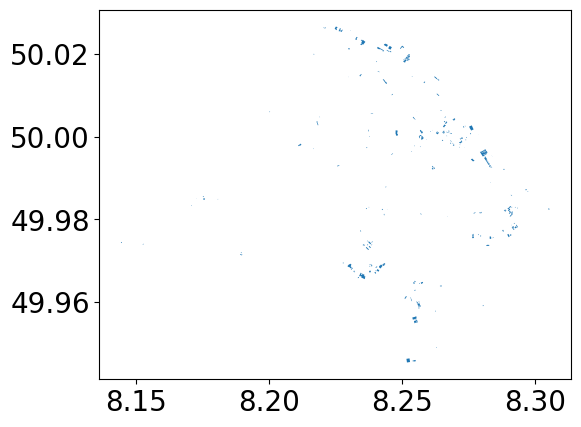

In [108]:
commercial.plot()

In [109]:
# find commercial counts in the grid
masks_commercial = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = commercial.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_commercial.append(pip_mask)

#commercial counts to the dataframe
commercial_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    commercial_count.append(commercial[masks_commercial[i]].shape[0])

berlin_polyframe_lat_long_new['commercial_count'] = commercial_count


100%|██████████| 493/493 [00:00<00:00, 1694.92it/s]


##### building = Retail stores

In [110]:
retail = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "retail"},
)
retail.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-retail_building.csv")
retail.head()

geometry  \
element_type osmid                                                         
way          23529426  POLYGON ((8.22711 49.96864, 8.22644 49.96819, ...   
             23655731  POLYGON ((8.27062 49.99955, 8.27075 49.99939, ...   
             23740483  POLYGON ((8.23648 49.96686, 8.23656 49.96576, ...   
             23740484  POLYGON ((8.23764 49.96834, 8.23772 49.96803, ...   
             24027751  POLYGON ((8.21717 50.01006, 8.21754 50.01013, ...   

                      layer wheelchair access amenity  fee maxheight  \
element_type osmid                                                     
way          23529426   NaN        yes    NaN     NaN  NaN       NaN   
             23655731   NaN        NaN    NaN     NaN  NaN       NaN   
             23740483   NaN        NaN    NaN     NaN  NaN       NaN   
             23740484   NaN        yes    NaN     NaN  NaN       NaN   
             24027751   NaN    limited    NaN     NaN  NaN       NaN   

                                   name parking addr:city  ...  \
element_type osmid                                         ...   
way          23529426  Gutenberg-Center     NaN     Mainz  ...   
             23655731     Staatstheater     NaN     Mainz  ...   
             23740483          HORNBACH     NaN     Mainz  ...   
             23740484               NaN     NaN     Mainz  ...   
             24027751               NaN     NaN     Mainz  ...   

                      service:bicycle:repair service:bicycle:retail  \
element_type osmid                                                    
way          23529426                    NaN                    NaN   
             23655731                    NaN                    NaN   
             23740483                    NaN                    NaN   
             23740484                    NaN                    NaN   
             24027751                    NaN                    NaN   

                      service:bicycle:sales service:bicycle:second_hand  \
element_type osmid                                                        
way          23529426                   NaN                         NaN   
             23655731                   NaN                         NaN   
             23740483                   NaN                         NaN   
             23740484                   NaN                         NaN   
             24027751                   NaN                         NaN   

                      service:bicycle:service service:bicycle:tools stroller  \
element_type osmid                                                             
way          23529426                     NaN                   NaN      NaN   
             23655731                     NaN                   NaN      NaN   
             23740483                     NaN                   NaN      NaN   
             23740484                     NaN                   NaN      NaN   
             24027751                     NaN                   NaN      NaN   

                      ways type building:use  
element_type osmid                            
way          23529426  NaN  NaN          NaN  
             23655731  NaN  NaN          NaN  
             23740483  NaN  NaN          NaN  
             23740484  NaN  NaN          NaN  
             24027751  NaN  NaN          NaN  

[5 rows x 114 columns]

<Axes: >

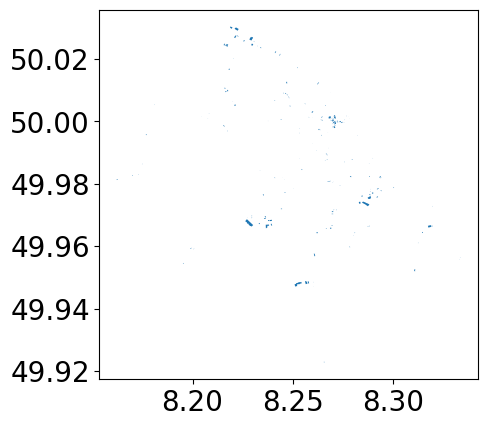

In [111]:
retail.plot()

In [112]:
# find retail counts in the grid
masks_retail = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = retail.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_retail.append(pip_mask)

#retail counts to the dataframe
retail_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    retail_count.append(retail[masks_retail[i]].shape[0])

berlin_polyframe_lat_long_new['retail_count'] = retail_count

100%|██████████| 493/493 [00:00<00:00, 1739.82it/s]


##### amenity=place_of_worship

In [113]:
place_of_worship = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "place_of_worship"},
)
place_of_worship.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-place_of_worship.csv")
place_of_worship.head()

addr:city addr:country addr:housenumber addr:postcode  \
element_type osmid                                                             
node         210523935     Mainz           DE               43         55124   
             261742426       NaN          NaN              NaN           NaN   
             289241840       NaN          NaN              NaN           NaN   
             310998506       NaN          NaN              NaN           NaN   
             571413108       NaN          NaN              NaN           NaN   

                                   addr:street           amenity  \
element_type osmid                                                 
node         210523935  Kurt-Schumacher-Straße  place_of_worship   
             261742426                     NaN  place_of_worship   
             289241840                     NaN  place_of_worship   
             310998506                     NaN  place_of_worship   
             571413108                     NaN  place_of_worship   

                          denomination                               name  \
element_type osmid                                                          
node         210523935      protestant  Freie evengelische Gemeinde Mainz   
             261742426             NaN                   Friedhofskapelle   
             289241840             NaN           Käsbrot-Heiligenhäuschen   
             310998506      protestant           Gemeindehaus Frankenhöhe   
             571413108  roman_catholic                      Marienkapelle   

                                 phone   religion  ... name:tr name:ar  \
element_type osmid                                 ...                   
node         210523935  +49 6131 44926  christian  ...     NaN     NaN   
             261742426             NaN  christian  ...     NaN     NaN   
             289241840             NaN  christian  ...     NaN     NaN   
             310998506             NaN  christian  ...     NaN     NaN   
             571413108             NaN  christian  ...     NaN     NaN   

                       operator:website name:etymology:wikidata  \
element_type osmid                                                
node         210523935              NaN                     NaN   
             261742426              NaN                     NaN   
             289241840              NaN                     NaN   
             310998506              NaN                     NaN   
             571413108              NaN                     NaN   

                       denomination:de name:mk place_of_worship:type ways  \
element_type osmid                                                          
node         210523935             NaN     NaN                   NaN  NaN   
             261742426             NaN     NaN                   NaN  NaN   
             289241840             NaN     NaN                   NaN  NaN   
             310998506             NaN     NaN                   NaN  NaN   
             571413108             NaN     NaN                   NaN  NaN   

                       name:ro type  
element_type osmid                   
node         210523935     NaN  NaN  
             261742426     NaN  NaN  
             289241840     NaN  NaN  
             310998506     NaN  NaN  
             571413108     NaN  NaN  

[5 rows x 91 columns]

<Axes: >

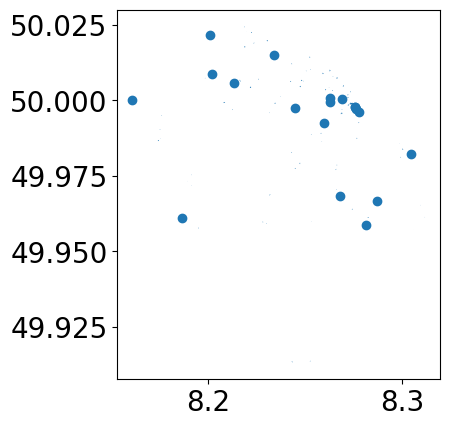

In [114]:
place_of_worship.plot()

In [115]:
# find place_of_worship counts in the grid
masks_place_of_worship = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = place_of_worship.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_place_of_worship.append(pip_mask)

#place_of_worship counts to the dataframe
place_of_worship_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    place_of_worship_count.append(place_of_worship[masks_place_of_worship[i]].shape[0])

berlin_polyframe_lat_long_new['place_of_worship_count'] = place_of_worship_count


100%|██████████| 493/493 [00:00<00:00, 1771.63it/s]


#### Detailed CSV SAVE

In [116]:
# save the dataframe
berlin_polyframe_lat_long_new.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/processed/{name}_data_detailed.csv")